## Model inference and explainability notebook

This notebook contains the code used to test the trained SigLIP classifier on individual images and to generate Grad-CAM explanations for the predictions.

### Library setup

The required version of the Transformers library is installed first so that the SigLIP model is loaded with the same setup used during development.

In [1]:
!pip install -q transformers==5.12.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.2/11.2 MB 83.1 MB/s eta 0:00:00:00:01:01


### Explainability libraries

Grad-CAM is used later to visualise which image regions contribute to a prediction. The OpenAI package is used for the optional natural-language interpretation of the heatmap.

In [2]:
!pip install grad-cam openai

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.5/44.5 kB 1.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.2/12.2 MB 91.5 MB/s eta 0:00:00:00:01:01
  Created wheel for grad-cam: filename=grad_cam-1.5.7-py3-none-any.whl size=53345 sha256=3a043f35e6d2c80897196eec1db522d6706e14a7c0634af4849a0f0a292cf21e
  Stored in directory: /root/.cache/pip/wheels/05/bd/e2/0c0eecf3c26b6cdb231b5656d53905bddc8090d69619d57e6b
Successfully built grad-cam
  Attempting uninstall: cuda-bindings
    Found existing installation: cuda-bindings 13.2.0
    Uninstalling cuda-bindings-13.2.0:
      Successfully uninstalled cuda-bindings-13.2.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask-cuda 26.2.0 requires cuda-core==0.3.*, but yo

### Imports

The main libraries for PyTorch, image processing, evaluation and the Hugging Face model are imported here.

In [3]:
import os
import random
import numpy as np
import torch
import torch.nn as nn
from pathlib import Path
from PIL import Image, ImageEnhance, ImageFilter
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix, classification_report
from transformers import AutoProcessor, AutoModel
from tqdm import tqdm
import io


### Grad-CAM and LLM imports

These imports are required for generating class-specific Grad-CAM maps and for sending the resulting visualisation to the language model.

In [4]:
from openai import OpenAI

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

### Plotting

Matplotlib is used to display the input images and the explainability results.

In [5]:
import matplotlib.pyplot as plt

### Device selection

CUDA is used when a GPU is available; otherwise the notebook runs on the CPU.

In [6]:
device = "cuda" if torch.cuda.is_available() else "cpu"

### SigLIP processor

I use the processor associated with `google/siglip-base-patch16-224` so that each input image is converted into the format expected by the pretrained SigLIP vision encoder.

In [7]:
MODEL_NAME = "google/siglip-base-patch16-224"

processor = AutoProcessor.from_pretrained(MODEL_NAME,attn_implementation="eager")

preprocessor_config.json:   0%|          | 0.00/368 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/432 [00:00<?, ?B/s]

[transformers] Model config: bos_token_id must be `None` or an integer within the vocabulary (between 0 and 31999), got 49406. This may result in unexpected behavior.
[transformers] Model config: eos_token_id must be `None` or an integer within the vocabulary (between 0 and 31999), got 49407. This may result in unexpected behavior.


tokenizer_config.json:   0%|          | 0.00/711 [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/798k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/409 [00:00<?, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

### SigLIP binary classifier

This class uses SigLIP as the vision backbone and adds a small classification head for the two classes: real and AI-generated. The pooled representation from the vision encoder is passed to the classifier to produce the final logits.

In [8]:
class SigLIPDetector(nn.Module):
    def __init__(self, model_name="google/siglip-base-patch16-224"):
        super().__init__()

        self.backbone = AutoModel.from_pretrained(model_name,  attn_implementation="eager")

        hidden_size = self.backbone.config.vision_config.hidden_size

        self.classifier = nn.Sequential(
            nn.LayerNorm(hidden_size),
            nn.Dropout(0.3),
            nn.Linear(hidden_size, 512),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(512, 2)
        )

    def forward(self, pixel_values):
        outputs = self.backbone.vision_model(pixel_values=pixel_values)
        features = outputs.pooler_output
        logits = self.classifier(features)
        return logits

### Loading the trained model

The detector is created and the best checkpoint obtained during training is loaded from the Kaggle model directory.

In [9]:
MODEL_NAME = "google/siglip-base-patch16-224"

model = SigLIPDetector(MODEL_NAME).to(device)
model.load_state_dict(
    torch.load("/kaggle/input/models/nishant2015/aidetector/pytorch/default/1/best_openfake_siglip50k.pth", map_location=device)
)


model.safetensors:   0%|          | 0.00/813M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/408 [00:00<?, ?it/s]

<All keys matched successfully>

### Checking transformer attention

Before applying Grad-CAM, I checked that attention outputs could be returned correctly by the SigLIP vision transformer. This cell runs one image through the backbone and prints the attention tensor information.

In [10]:
from PIL import Image
import torch

image_path = "/kaggle/input/datasets/nishant2015/testgrok/waldemar-brandt-iiwYpGkbDgM-unsplash.jpg"

image = Image.open(image_path).convert("RGB")

inputs = processor(
    images=image,
    return_tensors="pt"
)

pixel_values = inputs["pixel_values"].to(device)

print("Pixel values shape:", pixel_values.shape)

model.eval()

with torch.no_grad():
    outputs = model.backbone.vision_model(
        pixel_values=pixel_values,
        output_attentions=True,
        return_dict=True
    )

print("\nAttentions is None:", outputs.attentions is None)

if outputs.attentions is not None:
    print("Number of attention layers:", len(outputs.attentions))
    print("Final attention shape:", outputs.attentions[-1].shape)

Pixel values shape: torch.Size([1, 3, 224, 224])

Attentions is None: False
Number of attention layers: 12
Final attention shape: torch.Size([1, 12, 196, 196])


### Model configuration check

This cell prints the Transformers version and the attention configuration. I used it mainly to confirm that eager attention was active while testing the explainability code.

In [11]:
print("Transformers version:")
import transformers
print(transformers.__version__)

print("\nBackbone attention implementation:")
print(model.backbone.config._attn_implementation)

print("\nVision config output_attentions:")
print(model.backbone.vision_model.config.output_attentions)

Transformers version:
5.12.0

Backbone attention implementation:
eager

Vision config output_attentions:
False


### Single-image prediction function

This function performs the normal inference pipeline for one image. The image is preprocessed, passed through the trained detector, and the logits are converted to real and AI-generated probabilities using softmax.

In [12]:
from PIL import Image
import torch

def predict_single_image(image_path, model, processor, device, threshold=0.5):
    model.eval()

    image = Image.open(image_path).convert("RGB")

    inputs = processor(
        images=image,
        return_tensors="pt"
    )

    pixel_values = inputs["pixel_values"].to(device)

    with torch.no_grad():
        logits = model(pixel_values)
        probs = torch.softmax(logits, dim=1)[0]

    real_prob = probs[0].item()
    fake_prob = probs[1].item()

    if fake_prob >= threshold:
        prediction = "AI-generated / Fake"
        confidence = fake_prob
    else:
        prediction = "Real"
        confidence = real_prob

    print("Prediction:", prediction)
    print(f"Real probability: {real_prob:.4f}")
    print(f"Fake probability: {fake_prob:.4f}")
    print(f"Confidence: {confidence:.4f}")

    return {
        "prediction": prediction,
        "real_probability": real_prob,
        "fake_probability": fake_prob,
        "confidence": confidence
    }

In [13]:
result = predict_single_image(
    "/kaggle/input/datasets/nishant2015/testgrok/WIN_20260605_14_38_10_Pro.jpg",
    model,
    processor,
    device
)

Prediction: Real
Real probability: 0.9899
Fake probability: 0.0101
Confidence: 0.9899


### Grad-CAM model wrapper

A small wrapper is used so that the trained detector can be passed directly to the Grad-CAM implementation without changing the original model.

In [14]:
class GradCAMWrapper(torch.nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, pixel_values):
        return self.model(pixel_values)

### Initial Grad-CAM test

This function was used to test class-specific Grad-CAM on a single image. The predicted class is used as the target so that the heatmap shows the regions contributing to the model's actual decision.

In [15]:
from PIL import Image
import numpy as np
import torch
import matplotlib.pyplot as plt

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

def gradcam_single_image(image_path, model, processor, device):
    model.eval()

    image = Image.open(image_path).convert("RGB")

    inputs = processor(
        images=image,
        return_tensors="pt"
    )

    pixel_values = inputs["pixel_values"].to(device)

    with torch.no_grad():
        logits = model(pixel_values)
        probs = torch.softmax(logits, dim=1)[0]

    real_prob = probs[0].item()
    fake_prob = probs[1].item()

    predicted_class = int(torch.argmax(probs).item())

    prediction = (
        "AI-generated"
        if predicted_class == 1
        else "Real"
    )

    target_layers = [
        model.backbone
        .vision_model
        .encoder
        .layers[-1]
        .layer_norm1
    ]

    targets = [
        ClassifierOutputTarget(predicted_class)
    ]

    with GradCAM(
        model=model,
        target_layers=target_layers,
        reshape_transform=reshape_transform
    ) as cam:

        grayscale_cam = cam(
            input_tensor=pixel_values,
            targets=targets
        )[0]

    vis_image = image.resize((224, 224))

    vis_image = (
        np.array(vis_image)
        .astype(np.float32)
        / 255.0
    )

    cam_image = show_cam_on_image(
        vis_image,
        grayscale_cam,
        use_rgb=True
    )

    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(vis_image)
    plt.title("ORIGINAL IMAGE")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(cam_image)

    plt.title(
        f"GRAD-CAM\n"
        f"{prediction}\n"
        f"Real: {real_prob:.3f}, AI: {fake_prob:.3f}"
    )

    plt.axis("off")

    plt.tight_layout()
    plt.show()

    return {
        "prediction": prediction,
        "predicted_class": predicted_class,
        "real_probability": real_prob,
        "ai_probability": fake_prob,
        "gradcam": grayscale_cam,
        "cam_image": cam_image
    }

### Earlier Grad-CAM experiment

This was an earlier version of the explainability function where Grad-CAM was applied to the patch-embedding layer. I kept it in the notebook as part of the development process before moving to the final transformer-layer approach used below.

In [16]:
def gradcam_single_image_with_llm(
    image_path,
    model,
    processor,
    device,
    save_path="gradcam_result.jpg",
    use_llm=True
):
    model.eval()

    image = Image.open(image_path).convert("RGB")

    inputs = processor(
        images=image,
        return_tensors="pt"
    )

    pixel_values = inputs["pixel_values"].to(device)

    target_layers = [
        model.backbone.vision_model.embeddings.patch_embedding
    ]

    cam = GradCAM(
        model=model,
        target_layers=target_layers
    )

    grayscale_cam = cam(
        input_tensor=pixel_values
    )[0]

    vis_image = image.resize((224, 224))
    vis_image = np.array(vis_image).astype(np.float32) / 255.0

    cam_image = show_cam_on_image(
        vis_image,
        grayscale_cam,
        use_rgb=True
    )

    Image.fromarray(cam_image).save(save_path)

    with torch.no_grad():
        logits = model(pixel_values)
        probs = torch.softmax(logits, dim=1)[0]

    real_prob = probs[0].item()
    fake_prob = probs[1].item()

    prediction = "AI-generated" if fake_prob >= 0.5 else "Real"

    explanation = None

    if use_llm:
        explanation = explain_gradcam_with_llm(
        original_image_path=image_path,
        gradcam_path=save_path,
        prediction=prediction,
        real_prob=real_prob,
        fake_prob=fake_prob
        )

    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(vis_image)
    plt.title("ORIGINAL IMAGE")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(cam_image)
    plt.title(
        f"GRADCAM\n{prediction}\nReal: {real_prob:.3f}, AI: {fake_prob:.3f}"
    )
    plt.axis("off")

    plt.show()

    if explanation:
        print("\nLLM Explanation:")
        print(explanation)

    return {
        "prediction": prediction,
        "real_probability": real_prob,
        "fake_probability": fake_prob,
        "gradcam_path": save_path,
        "llm_explanation": explanation
    }

### OpenAI API key

The API key is read from Kaggle Secrets rather than being written directly in the notebook.

In [17]:
from kaggle_secrets import UserSecretsClient
user_secrets = UserSecretsClient()
secret_value_0 = user_secrets.get_secret("OPENAI_API_KEY")


### OpenAI client

The retrieved key is stored as an environment variable and used to initialise the OpenAI client for the later explanation step.

In [18]:
from kaggle_secrets import UserSecretsClient
from openai import OpenAI
import os

user_secrets = UserSecretsClient()

secret_value_0 = user_secrets.get_secret("OPENAI_API_KEY")

os.environ["OPENAI_API_KEY"] = secret_value_0

client = OpenAI(
    api_key=os.getenv("OPENAI_API_KEY")
)

### Reshaping transformer activations for Grad-CAM

SigLIP produces a sequence of 196 spatial patch tokens rather than a CNN-style feature map. For a 224 × 224 input with 16 × 16 patches, these tokens correspond to a 14 × 14 grid. This function reshapes the transformer activations into `[batch, channels, 14, 14]` so that Grad-CAM can process them spatially.

In [19]:
def reshape_transform(tensor):
    """
    Convert SigLIP transformer activations from:

        [batch, 196, hidden]

    to:

        [batch, hidden, 14, 14]

    SigLIP-Base Patch16-224 uses 196 spatial patch tokens,
    therefore no CLS token is removed.
    """

    if isinstance(tensor, tuple):
        tensor = tensor[0]

    if tensor.ndim != 3:
        raise ValueError(
            "Expected transformer activation shape "
            "[batch, tokens, hidden_size], "
            f"but received {tuple(tensor.shape)}."
        )

    batch_size, number_of_tokens, hidden_size = tensor.shape

    grid_size = int(number_of_tokens ** 0.5)

    if grid_size * grid_size != number_of_tokens:
        raise ValueError(
            f"Cannot reshape {number_of_tokens} tokens "
            "into a square spatial grid."
        )

    tensor = tensor.reshape(
        batch_size,
        grid_size,
        grid_size,
        hidden_size
    )

    tensor = tensor.permute(
        0,
        3,
        1,
        2
    )

    return tensor

### Final Grad-CAM generation

This is the Grad-CAM implementation used for the final experiments. I target `layer_norm1` in the last SigLIP transformer block and explain the class predicted by the detector. The resulting 14 × 14 attribution map is resized to the input resolution and overlaid on a grayscale version of the image to make the highlighted regions easier to see.

In [20]:
def generate_gradcam(
    image_path,
    model,
    processor,
    device,
    save_path="gradcam_result.png"
):
    model.eval()

    image = Image.open(image_path).convert("RGB")

    inputs = processor(
        images=image,
        return_tensors="pt"
    )

    pixel_values = inputs["pixel_values"].to(device)

    with torch.no_grad():
        logits = model(pixel_values)

        probabilities = torch.softmax(
            logits,
            dim=1
        )[0]

    predicted_class = int(
        torch.argmax(probabilities).item()
    )

    real_probability = float(
        probabilities[0].item()
    )

    ai_probability = float(
        probabilities[1].item()
    )

    prediction = (
        "AI-generated"
        if predicted_class == 1
        else "Real"
    )

    target_layers = [
        model
        .backbone
        .vision_model
        .encoder
        .layers[-1]
        .layer_norm1
    ]

    targets = [
        ClassifierOutputTarget(
            predicted_class
        )
    ]

    with GradCAM(
        model=model,
        target_layers=target_layers,
        reshape_transform=reshape_transform
    ) as cam:

        grayscale_cam = cam(
            input_tensor=pixel_values,
            targets=targets
        )[0]

    grayscale_cam = np.clip(
        grayscale_cam,
        0.0,
        1.0
    )

    grayscale_cam = cv2.resize(
        grayscale_cam,
        (224, 224),
        interpolation=cv2.INTER_CUBIC
    )

    resized_image = image.resize(
        (224, 224),
        Image.Resampling.LANCZOS
    )

    image_np = np.asarray(
        resized_image,
        dtype=np.uint8
    )

    grayscale_background = cv2.cvtColor(
        image_np,
        cv2.COLOR_RGB2GRAY
    )

    grayscale_background = cv2.cvtColor(
        grayscale_background,
        cv2.COLOR_GRAY2RGB
    )

    grayscale_background = (
        grayscale_background.astype(np.float32)
        / 255.0
    )

    cam_image = show_cam_on_image(
        grayscale_background,
        grayscale_cam,
        use_rgb=True,
        image_weight=0.55
    )

    Image.fromarray(cam_image).save(
        save_path
    )

    return {
        "prediction": prediction,
        "predicted_class": predicted_class,
        "real_probability": real_probability,
        "ai_probability": ai_probability,
        "gradcam_path": save_path,
        "original_image": resized_image,
        "cam_image": cam_image,
        "raw_cam": grayscale_cam
    }

### Preparing images for the LLM

The image is resized if necessary and converted to a PNG data URL. This allows both the original image and the Grad-CAM output to be included in a multimodal API request.

In [21]:
def image_to_png_data_url(
    image_path,
    max_size=768
):
    image = Image.open(
        image_path
    ).convert("RGB")

    image.thumbnail(
        (max_size, max_size)
    )

    with tempfile.NamedTemporaryFile(
        suffix=".png",
        delete=False
    ) as tmp:
        temp_path = tmp.name

    image.save(
        temp_path,
        format="PNG"
    )

    with open(temp_path, "rb") as f:
        encoded = base64.b64encode(
            f.read()
        ).decode("utf-8")

    os.remove(temp_path)

    return f"data:image/png;base64,{encoded}"

### LLM explanation of the Grad-CAM result

This function sends the original image, Grad-CAM overlay and prediction probabilities to GPT-5.6 Sol. The prompt asks the model to focus mainly on the strongest highlighted regions and to use the original image only for identifying what those regions contain.

In [22]:
def explain_gradcam_with_llm(
    gradcam_path,
    original_image_path,
    prediction,
    real_prob,
    fake_prob
):

    if os.getenv("OPENAI_API_KEY") is None:
        return (
            "LLM explanation unavailable because "
            "OPENAI_API_KEY is not configured."
        )

    gradcam_data_url = image_to_png_data_url(
        gradcam_path
    )

    original_image_data_url = image_to_png_data_url(
        original_image_path
    )

    prompt = f"""
You are analysing the visual explanation produced by an AI-generated image detector.

Two images are provided:

Image 1 is the original input image.
Image 2 is the class-specific Grad-CAM attribution heatmap overlay generated for the detector's predicted class.

Use the original image only to identify the objects, structures, people, or scene regions corresponding to highlighted areas in the Grad-CAM overlay.

The Grad-CAM overlay must be the primary and only source for determining which image regions received attribution.

Prediction: {prediction}
Real probability: {real_prob:.3f}
AI-generated probability: {fake_prob:.3f}

Interpret the Grad-CAM heatmap using the following rules:

• Red / Orange = strongest class-specific attribution regions.
  Larger and more intense red/orange regions indicate
  stronger Grad-CAM attribution.
• Yellow / Green = moderate or weaker attribution.
• Blue = low attribution.
• Grey = underlying image background only and should
  not be interpreted as attribution.

Focus primarily on the strongest red and orange regions.
Mention at most four dominant highlighted regions.

If only part of an object or area is strongly highlighted,
describe only that highlighted part rather than the whole object.

Important rules:
• Determine attribution locations only from the Grad-CAM overlay.
• Use the original image only to understand what is present
  at those highlighted locations.
• Do not identify a region as important simply because it
  is visually prominent in the original image.
• Ignore grey background regions unless they contain a
  coloured Grad-CAM activation.
• Describe highlighted regions as areas strongly associated
  with the predicted class.
• Do not claim that a highlighted region definitively caused
  the prediction or reveals the model's complete reasoning.
• Do not invent explanations that cannot be directly supported
  by the visualisation.
• Do not state that any object, texture, colour, or scene
  characteristic is inherently typical of AI-generated images.
• If a hotspot appears in the background or near an image edge,
  describe that location accurately.
• If activation occurs near a person but primarily covers the
  surrounding background, describe the background region.
• Do not speculate about lighting, textures, shadows,
  manipulation artefacts, or generation artefacts unless
  they are clearly visible within the strongest highlighted region.
• Use cautious language such as "appears", "may", "might",
  "could", "is associated with", or "shows strong attribution".
• Include both prediction probabilities as percentages.
• Keep the prediction result and Grad-CAM interpretation
  conceptually separate.

Return the explanation as plain text with no Markdown formatting.
Write one concise paragraph of approximately 150 words
for a non-technical audience.
"""

    try:
        response = client.chat.completions.create(
            model="gpt-5.6-sol",
            reasoning_effort="none",
            messages=[
                {
                    "role": "user",
                    "content": [
                        {
                            "type": "text",
                            "text": prompt
                        },
                        {
                            "type": "image_url",
                            "image_url": {
                                "url": original_image_data_url
                            }
                        },
                        {
                            "type": "image_url",
                            "image_url": {
                                "url": gradcam_data_url
                            }
                        }
                    ]
                }
            ],
            max_completion_tokens=200
        )

        return response.choices[0].message.content

    except Exception as e:
        return (
            "LLM explanation unavailable: "
            f"{str(e)}"
        )

### Complete explainability pipeline

This function combines the detector prediction, Grad-CAM generation and optional LLM explanation. It also creates a figure showing the original image, the attribution map and the generated explanation together for qualitative inspection.

In [23]:
import matplotlib.pyplot as plt
import textwrap

def analyse_explainability_example(
    image_path,
    model,
    processor,
    device,
    save_path="gradcam_result.png",
    use_llm=True
):

    result = generate_gradcam(
        image_path=image_path,
        model=model,
        processor=processor,
        device=device,
        save_path=save_path
    )

    explanation = None

    if use_llm:
        explanation = explain_gradcam_with_llm(
            gradcam_path=result["gradcam_path"],
            original_image_path=image_path,
            prediction=result["prediction"],
            real_prob=result["real_probability"],
            fake_prob=result["ai_probability"]
        )
    fig, axes = plt.subplots(
        1,
        3,
        figsize=(20, 7),
        gridspec_kw={
            "width_ratios": [1.15, 1.15, 1.0],
            "wspace": 0.06
        }
    )
    
    axes[0].imshow(result["original_image"])
    axes[0].set_title(
        "Original Image",
        fontsize=15
    )
    axes[0].axis("off")
    
    axes[1].imshow(result["cam_image"])
    
    axes[1].set_title(
        f"Grad-CAM — {result['prediction']}\n"
        f"Real: {result['real_probability']:.2%} | "
        f"AI: {result['ai_probability']:.2%}",
        fontsize=19
    )
    
    axes[1].axis("off")
    
    axes[2].axis("off")
    
    axes[2].set_title(
        "GPT-5.6 Sol Explanation",
        fontsize=19
    )
    
    if explanation:
        wrapped_text = textwrap.fill(
            explanation,
            width=42
        )
    else:
        wrapped_text = "Explanation unavailable."
    
    axes[2].text(
    0.0,
    0.98,
    wrapped_text,
    transform=axes[2].transAxes,
    fontsize=15,
    fontweight="bold",
    verticalalignment="top",
    horizontalalignment="left",
    linespacing=1.25
    )
    
    plt.subplots_adjust(
        left=0.01,
        right=0.99,
        top=0.90,
        bottom=0.02,
        wspace=0.06
    )
    
    full_figure_path = save_path.replace(
        ".png",
        "_with_explanation.png"
    )
    
    plt.savefig(
        full_figure_path,
        dpi=300,
        bbox_inches="tight",
        pad_inches=0.05
    )
    
    plt.show()
    return {
        **result,
        "llm_explanation": explanation,
        "full_figure_path": full_figure_path
    }

### Additional utilities

These packages are used by the image encoding, OpenCV resizing and plotting steps in the final explainability pipeline.

In [24]:
import os
import base64
import tempfile
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt

### Qualitative inference examples

The following cells run the same explainability pipeline on a selection of test images. I used several examples to inspect how the model and Grad-CAM behaved across different real and AI-generated inputs, so separate Markdown commentary is not repeated for every image.

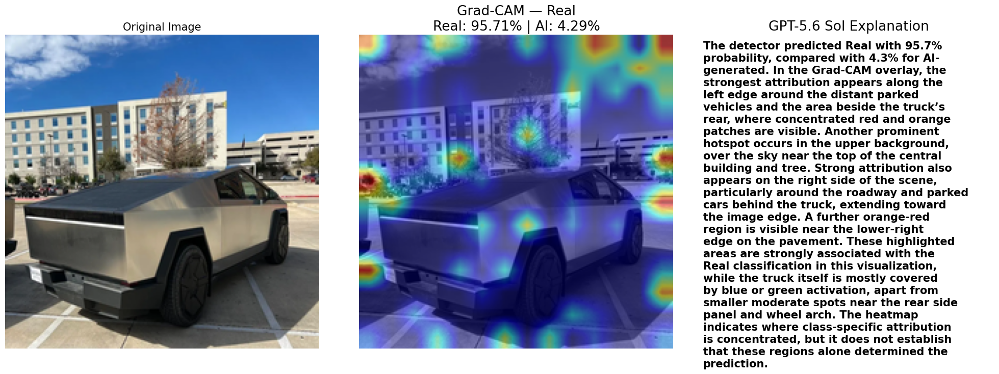

In [25]:
result = analyse_explainability_example(
    image_path="/kaggle/input/datasets/nishant2015/testgrok/0x0.webp",
    model=model,
    processor=processor,
    device=device,
    save_path="/kaggle/working/example_gradcam.png"
)

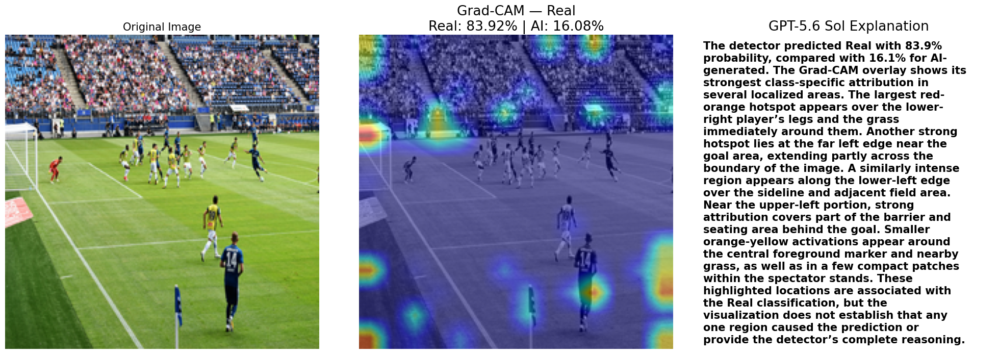

In [26]:
result = analyse_explainability_example(
    image_path="/kaggle/input/datasets/nishant2015/testgrok/waldemar-brandt-iiwYpGkbDgM-unsplash.jpg",
    model=model,
    processor=processor,
    device=device,
    save_path="/kaggle/working/example_gradcam.png"
)

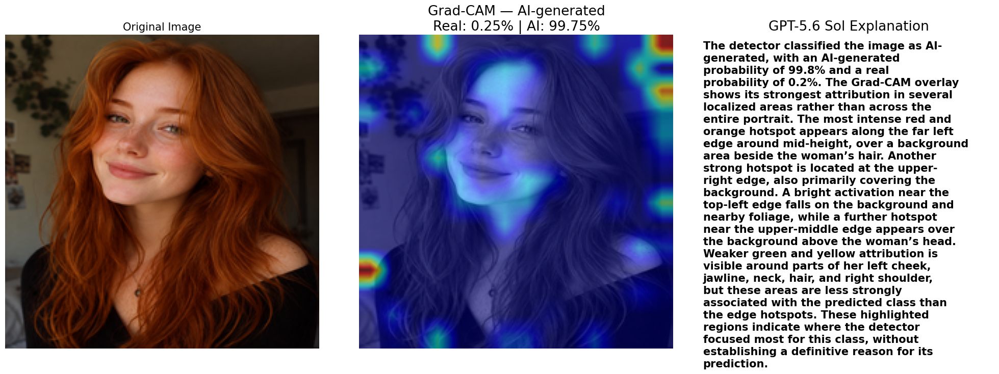

In [27]:
result = analyse_explainability_example(
    image_path="/kaggle/input/datasets/nishant2015/testgrok/file_00000000577471f8be80aebb015e1afe.png",
    model=model,
    processor=processor,
    device=device,
    save_path="/kaggle/working/example_gradcam.png"
)

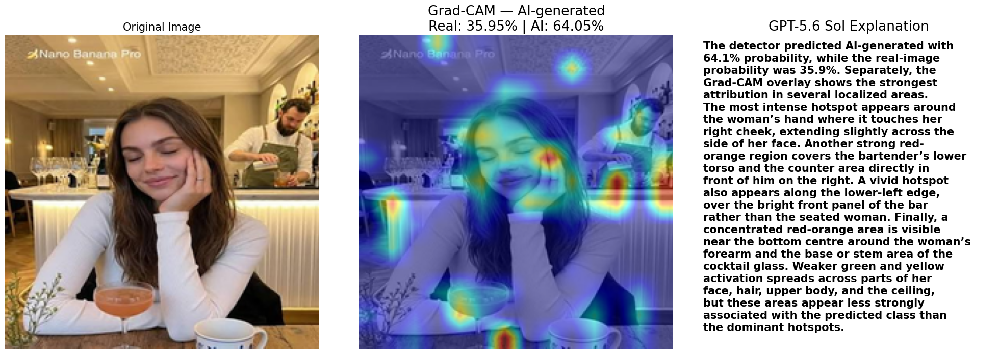

In [28]:
result = analyse_explainability_example(
    image_path="/kaggle/input/datasets/nishant2015/testgrok/falsepositive.jpg",
    model=model,
    processor=processor,
    device=device,
    save_path="/kaggle/working/example_gradcam.png"
)

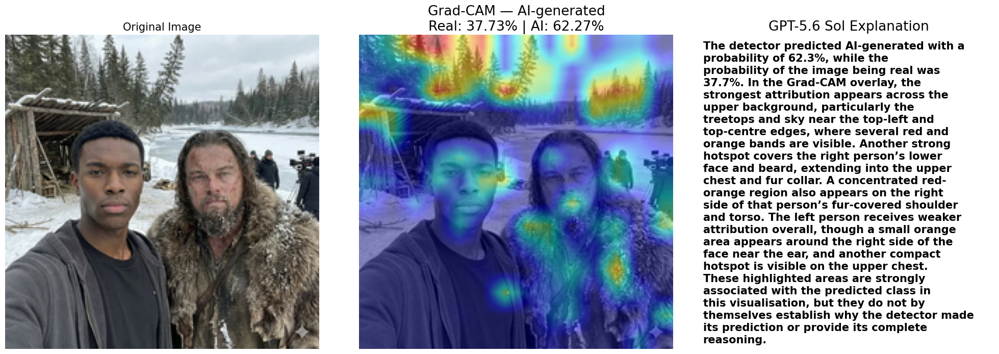

In [29]:
result = analyse_explainability_example(
    image_path="/kaggle/input/datasets/nishant2015/testgrok/maintaining-character-consistency-in-nano-banana-pro-using-v0-co2l8q682j4g1.webp",
    model=model,
    processor=processor,
    device=device,
    save_path="/kaggle/working/example_gradcam.png"
)

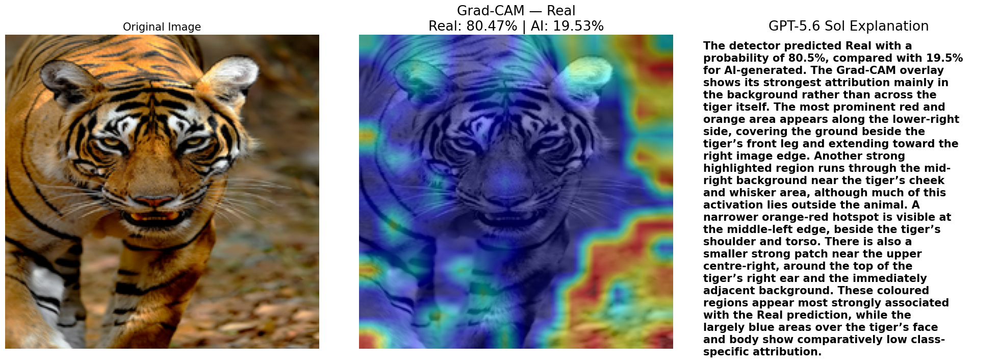

In [33]:
result = analyse_explainability_example(
    image_path="/kaggle/input/datasets/nishant2015/testgrok/CMJ7852_1BLOG.jpg",
    model=model,
    processor=processor,
    device=device,
    save_path="/kaggle/working/example_gradcam.png"
)

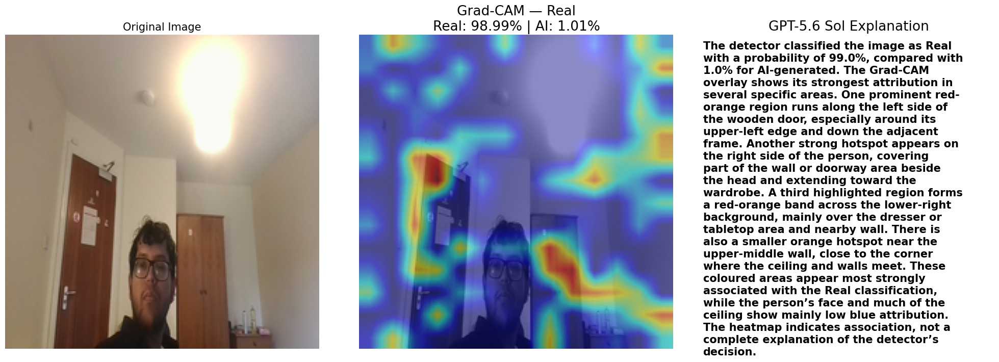

In [30]:
result = analyse_explainability_example(
    image_path="/kaggle/input/datasets/nishant2015/testgrok/WIN_20260605_14_38_10_Pro.jpg",
    model=model,
    processor=processor,
    device=device,
    save_path="/kaggle/working/example_gradcam.png"
)

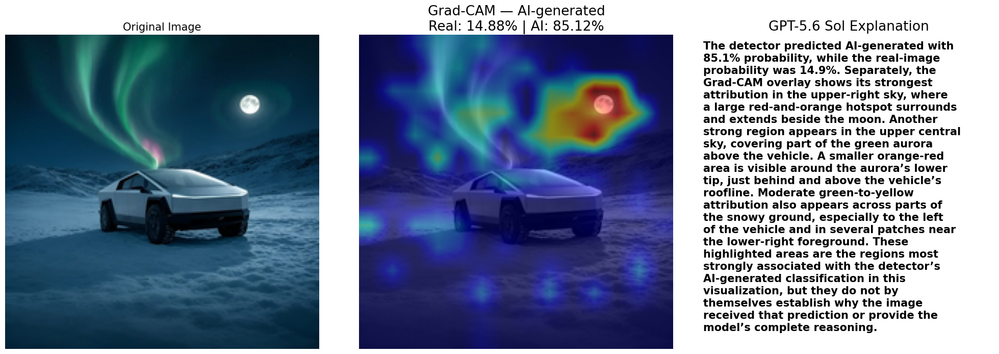

In [31]:
result = analyse_explainability_example(
    image_path="/kaggle/input/datasets/nishant2015/testgrok/aurora.webp",
    model=model,
    processor=processor,
    device=device,
    save_path="/kaggle/working/example_gradcam.png"
)

### Final qualitative comparison

To show both correct and incorrect predictions, four examples are selected to represent a true negative, false positive, true positive and false negative. Each original image is displayed next to its corresponding Grad-CAM result so that the prediction can be compared with the known class.

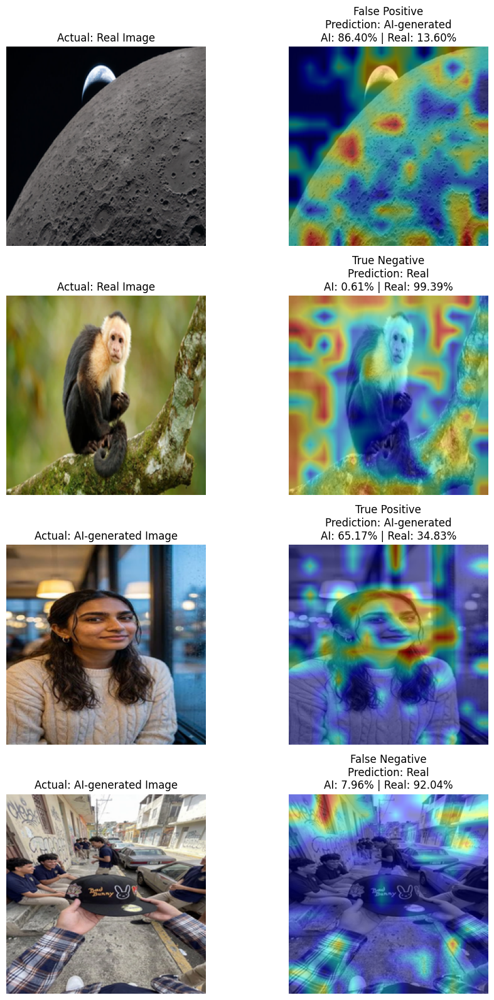

In [32]:
import matplotlib.pyplot as plt

image_paths = [
    "/kaggle/input/datasets/nishant2015/testgrok/TA6Xks6ueFV2Joz8sxbHgP.png",

    "/kaggle/input/datasets/nishant2015/testgrok/Favorite-and-Most-Popular-Animals_-Monkey-1024x535.jpg",

    "/kaggle/input/datasets/nishant2015/testgrok/images.jpg",

    "/kaggle/input/datasets/nishant2015/testgrok/show-your-nano-banana-pro-2-examples-v0-cxcmi678rf2g1.webp"
]

true_labels = [
    "Real Image",
    "Real Image",
    "AI-generated Image",
    "AI-generated Image"
]

outcome_labels = [
    "False Positive",
    "True Negative",
    "True Positive",
    "False Negative"
]

results = []

for i, image_path in enumerate(image_paths):

    save_path = f"classification_example_{i+1}.png"

    result = generate_gradcam(
        image_path=image_path,
        model=model,
        processor=processor,
        device=device,
        save_path=save_path
    )

    results.append(result)

fig, axes = plt.subplots(
    4,
    2,
    figsize=(10, 16)
)

for i, result in enumerate(results):

    axes[i, 0].imshow(result["original_image"])

    axes[i, 0].set_title(
        f"Actual: {true_labels[i]}"
    )

    axes[i, 0].axis("off")

    axes[i, 1].imshow(result["cam_image"])

    axes[i, 1].set_title(
        f"{outcome_labels[i]}\n"
        f"Prediction: {result['prediction']}\n"
        f"AI: {result['ai_probability'] * 100:.2f}% | "
        f"Real: {result['real_probability'] * 100:.2f}%"
    )

    axes[i, 1].axis("off")

plt.tight_layout()

plt.savefig(
    "classification_outcomes.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()